# IC3392: Compare nGIST v0.6 vs v0.7dev

This notebook compares the two nGIST output sets in the current folder:

- `v0.6/IC3392_*_maps.fits`
- `v0.7/IC3392_v0.7dev_*_maps.fits`

It follows the same workflow as `20260315_check_IC3392_v3tk_runs.ipynb`, adapted for the current `v0.6_v0.7_comparison` layout.

Focus:

1. Spatial binning
2. Stellar kinematics
3. SFH-derived maps
4. Emission-line gas flux and Halpha/[NII] gas kinematics

The workflow first inspects FITS structures, then auto-extracts matching maps and visualizes v0.6/v0.7/difference.

In [1]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import TwoSlopeNorm

%matplotlib inline
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.dpi'] = 120
pd.set_option('display.max_columns', None)

gal = 'IC3392'
root = Path('.').resolve()

files = {
    'v0.6': {
        'spatial': root / 'v0.6' / f'{gal}_SPATIAL_BINNING_maps.fits',
        'kin': root / 'v0.6' / f'{gal}_KIN_maps.fits',
        'sfh': root / 'v0.6' / f'{gal}_SFH_maps.fits',
        'gas': root / 'v0.6' / f'{gal}_gas_BIN_maps.fits',
    },
    'v0.7': {
        'spatial': root / 'v0.7' / f'{gal}_v0.7dev_SPATIAL_BINNING_maps.fits',
        'kin': root / 'v0.7' / f'{gal}_v0.7dev_KIN_maps.fits',
        'sfh': root / 'v0.7' / f'{gal}_v0.7dev_SFH_maps.fits',
        'gas': root / 'v0.7' / f'{gal}_v0.7dev_gas_BIN_maps.fits',
    },
}

for version, version_files in files.items():
    for kind, path in version_files.items():
        if not path.exists():
            raise FileNotFoundError(f'Missing {version}/{kind}: {path}')

print('All target files found.')
for version, version_files in files.items():
    print(f'\n{version}')
    for kind, path in version_files.items():
        print(f'  {kind:7s}: {path.relative_to(root)}')

All target files found.

v0.6
  spatial: v0.6/IC3392_SPATIAL_BINNING_maps.fits
  kin    : v0.6/IC3392_KIN_maps.fits
  sfh    : v0.6/IC3392_SFH_maps.fits
  gas    : v0.6/IC3392_gas_BIN_maps.fits

v0.7
  spatial: v0.7/IC3392_v0.7dev_SPATIAL_BINNING_maps.fits
  kin    : v0.7/IC3392_v0.7dev_KIN_maps.fits
  sfh    : v0.7/IC3392_v0.7dev_SFH_maps.fits
  gas    : v0.7/IC3392_v0.7dev_gas_BIN_maps.fits


In [2]:
def hdu_shape_from_header(hdu):
    naxis = int(hdu.header.get('NAXIS', 0) or 0)
    if naxis == 0:
        return None
    return tuple(hdu.header.get(f'NAXIS{i}', '?') for i in range(naxis, 0, -1))


def dtype_from_bitpix(bitpix):
    mapping = {
        8: 'uint8',
        16: 'int16',
        32: 'int32',
        64: 'int64',
        -32: 'float32',
        -64: 'float64',
    }
    return mapping.get(bitpix, f'BITPIX={bitpix}')


def summarize_hdus(path):
    rows = []
    with fits.open(path, memmap=True, ignore_missing_end=True) as hdul:
        for i, hdu in enumerate(hdul):
            bitpix = hdu.header.get('BITPIX')
            rows.append(
                {
                    'idx': i,
                    'extname': hdu.name,
                    'type': type(hdu).__name__,
                    'shape': hdu_shape_from_header(hdu),
                    'dtype': dtype_from_bitpix(bitpix) if bitpix is not None else None,
                    'bunit': hdu.header.get('BUNIT'),
                }
            )
    return pd.DataFrame(rows)


for version in ('v0.6', 'v0.7'):
    for kind in ('spatial', 'kin', 'sfh', 'gas'):
        path = files[version][kind]
        print(f'\n===== {version} :: {kind.upper()} :: {path.name} =====')
        display(summarize_hdus(path))


===== v0.6 :: SPATIAL :: IC3392_SPATIAL_BINNING_maps.fits =====


,idx,extname,type,shape,dtype,bunit
0,0,PRIMARY,PrimaryHDU,None,uint8,None
1,1,BINID,ImageHDU,"(438, 437)",float64,None
2,2,FLUX,ImageHDU,"(438, 437)",float64,None
3,3,SNR,ImageHDU,"(438, 437)",float64,None
4,4,SNRBIN,ImageHDU,"(438, 437)",float64,None
5,5,XBIN,ImageHDU,"(438, 437)",float64,None
6,6,YBIN,ImageHDU,"(438, 437)",float64,None



===== v0.6 :: KIN :: IC3392_KIN_maps.fits =====


,idx,extname,type,shape,dtype,bunit
0,0,PRIMARY,PrimaryHDU,None,uint8,None
1,1,V,ImageHDU,"(438, 437)",float64,None
2,2,SIGMA,ImageHDU,"(438, 437)",float64,None
3,3,H3,ImageHDU,"(438, 437)",float64,None
4,4,H4,ImageHDU,"(438, 437)",float64,None
5,5,FORM_ERR_V,ImageHDU,"(438, 437)",float64,None
6,6,FORM_ERR_SIGMA,ImageHDU,"(438, 437)",float64,None
7,7,FORM_ERR_H3,ImageHDU,"(438, 437)",float64,None
8,8,FORM_ERR_H4,ImageHDU,"(438, 437)",float64,None
9,9,SNR_POSTFIT,ImageHDU,"(438, 437)",float64,None



===== v0.6 :: SFH :: IC3392_SFH_maps.fits =====


,idx,extname,type,shape,dtype,bunit
0,0,PRIMARY,PrimaryHDU,None,uint8,None
1,1,AGE,ImageHDU,"(438, 437)",float64,None
2,2,METAL,ImageHDU,"(438, 437)",float64,None
3,3,ALPHA,ImageHDU,"(438, 437)",float64,None
4,4,SNR_POSTFIT,ImageHDU,"(438, 437)",float64,None
5,5,EBV,ImageHDU,"(438, 437)",float64,None



===== v0.6 :: GAS :: IC3392_gas_BIN_maps.fits =====


,idx,extname,type,shape,dtype,bunit
0,0,PRIMARY,PrimaryHDU,None,uint8,None
1,1,BIN_ID,ImageHDU,"(438, 437)",float64,None
2,2,V_STARS2,ImageHDU,"(438, 437)",float64,None
3,3,SIGMA_STARS2,ImageHDU,"(438, 437)",float64,None
4,4,CHI2_TOT,ImageHDU,"(438, 437)",float64,None
...,...,...,...,...,...,...
100,100,SII6730_SIGMA,ImageHDU,"(438, 437)",float64,None
101,101,SII6730_SIGMA_ERR,ImageHDU,"(438, 437)",float64,None
102,102,SII6730_SIGMA_CORR,ImageHDU,"(438, 437)",float64,None
103,103,NII_HA_BPT,ImageHDU,"(438, 437)",float64,None



===== v0.7 :: SPATIAL :: IC3392_v0.7dev_SPATIAL_BINNING_maps.fits =====


,idx,extname,type,shape,dtype,bunit
0,0,PRIMARY,PrimaryHDU,None,uint8,None
1,1,BINID,ImageHDU,"(438, 437)",float64,None
2,2,FLUX,ImageHDU,"(438, 437)",float64,None
3,3,SNR,ImageHDU,"(438, 437)",float64,None
4,4,SNRBIN,ImageHDU,"(438, 437)",float64,None
5,5,XBIN,ImageHDU,"(438, 437)",float64,None
6,6,YBIN,ImageHDU,"(438, 437)",float64,None



===== v0.7 :: KIN :: IC3392_v0.7dev_KIN_maps.fits =====


,idx,extname,type,shape,dtype,bunit
0,0,PRIMARY,PrimaryHDU,None,uint8,None
1,1,V,ImageHDU,"(438, 437)",float64,None
2,2,SIGMA,ImageHDU,"(438, 437)",float64,None
3,3,H3,ImageHDU,"(438, 437)",float64,None
4,4,H4,ImageHDU,"(438, 437)",float64,None
5,5,FORM_ERR_V,ImageHDU,"(438, 437)",float64,None
6,6,FORM_ERR_SIGMA,ImageHDU,"(438, 437)",float64,None
7,7,FORM_ERR_H3,ImageHDU,"(438, 437)",float64,None
8,8,FORM_ERR_H4,ImageHDU,"(438, 437)",float64,None
9,9,SNR_POSTFIT,ImageHDU,"(438, 437)",float64,None



===== v0.7 :: SFH :: IC3392_v0.7dev_SFH_maps.fits =====


,idx,extname,type,shape,dtype,bunit
0,0,PRIMARY,PrimaryHDU,None,uint8,None
1,1,AGE,ImageHDU,"(438, 437)",float64,None
2,2,METAL,ImageHDU,"(438, 437)",float64,None
3,3,ALPHA,ImageHDU,"(438, 437)",float64,None
4,4,SNR_POSTFIT,ImageHDU,"(438, 437)",float64,None
5,5,EBV,ImageHDU,"(438, 437)",float64,None



===== v0.7 :: GAS :: IC3392_v0.7dev_gas_BIN_maps.fits =====


,idx,extname,type,shape,dtype,bunit
0,0,PRIMARY,PrimaryHDU,None,uint8,None
1,1,BIN_ID,ImageHDU,"(438, 437)",float64,None
2,2,V_STARS2,ImageHDU,"(438, 437)",float64,None
3,3,SIGMA_STARS2,ImageHDU,"(438, 437)",float64,None
4,4,CHI2_TOT,ImageHDU,"(438, 437)",float64,None
...,...,...,...,...,...,...
142,142,SII6730_EW,ImageHDU,"(438, 437)",float64,None
143,143,SII6730_EW_ERR,ImageHDU,"(438, 437)",float64,None
144,144,SII6730_CONT,ImageHDU,"(438, 437)",float64,None
145,145,NII_HA_BPT,ImageHDU,"(438, 437)",float64,None


## Load Maps and Define Comparison Helpers

In [3]:
def read_map(path, extname):
    with fits.open(path, memmap=True, ignore_missing_end=True) as hdul:
        arr = np.array(hdul[extname].data, dtype=float)
    arr[~np.isfinite(arr)] = np.nan
    return arr


def align_map_pair(old_map, new_map, label=None):
    if old_map.shape == new_map.shape:
        return old_map, new_map
    if old_map.ndim != new_map.ndim:
        raise ValueError(
            f'{label or "map"}: cannot align maps with different dimensions: '
            f'v0.6 {old_map.shape}, v0.7 {new_map.shape}'
        )

    common_shape = tuple(min(o, n) for o, n in zip(old_map.shape, new_map.shape))
    slices = tuple(slice(0, n) for n in common_shape)
    if label is not None:
        print(
            f'Warning: {label} shape mismatch v0.6 {old_map.shape}, v0.7 {new_map.shape}; '
            f'using common crop {common_shape}.'
        )
    return old_map[slices], new_map[slices]


def read_map_pair(old_path, new_path, extname, label=None):
    old_map = read_map(old_path, extname)
    new_map = read_map(new_path, extname)
    return align_map_pair(old_map, new_map, label or extname)


def percent_change_map(old_map, new_map):
    old_map, new_map = align_map_pair(old_map, new_map)
    pct = np.full(old_map.shape, np.nan, dtype=float)
    mask = np.isfinite(old_map) & np.isfinite(new_map) & (old_map != 0)
    pct[mask] = 100.0 * (new_map[mask] - old_map[mask]) / np.abs(old_map[mask])
    return pct, mask


def compare_stats(old_map, new_map, label):
    old_map, new_map = align_map_pair(old_map, new_map, label)
    mask = np.isfinite(old_map) & np.isfinite(new_map)
    pct_map, pct_mask = percent_change_map(old_map, new_map)

    if mask.sum() == 0:
        return {
            'quantity': label,
            'n_valid': 0,
            'n_valid_nonzero_v0.6': 0,
            'median_v0.6': np.nan,
            'median_v0.7': np.nan,
            'median_delta_v0.7_minus_v0.6': np.nan,
            'mean_delta_v0.7_minus_v0.6': np.nan,
            'std_delta': np.nan,
            'rms_delta': np.nan,
            'median_pct_change': np.nan,
            'mean_pct_change': np.nan,
            'std_pct_change': np.nan,
            'rms_pct_change': np.nan,
            'median_abs_pct_change': np.nan,
            'pearson_r': np.nan,
        }

    old = old_map[mask]
    new = new_map[mask]
    delta = new - old
    pearson_r = float(np.corrcoef(old, new)[0, 1]) if old.size > 1 and np.nanstd(old) > 0 and np.nanstd(new) > 0 else np.nan

    pct_vals = pct_map[pct_mask]
    if pct_vals.size == 0:
        median_pct = mean_pct = std_pct = rms_pct = median_abs_pct = np.nan
    else:
        median_pct = float(np.nanmedian(pct_vals))
        mean_pct = float(np.nanmean(pct_vals))
        std_pct = float(np.nanstd(pct_vals))
        rms_pct = float(np.sqrt(np.nanmean(pct_vals**2)))
        median_abs_pct = float(np.nanmedian(np.abs(pct_vals)))

    return {
        'quantity': label,
        'n_valid': int(mask.sum()),
        'n_valid_nonzero_v0.6': int(pct_mask.sum()),
        'median_v0.6': float(np.nanmedian(old)),
        'median_v0.7': float(np.nanmedian(new)),
        'median_delta_v0.7_minus_v0.6': float(np.nanmedian(delta)),
        'mean_delta_v0.7_minus_v0.6': float(np.nanmean(delta)),
        'std_delta': float(np.nanstd(delta)),
        'rms_delta': float(np.sqrt(np.nanmean(delta**2))),
        'median_pct_change': median_pct,
        'mean_pct_change': mean_pct,
        'std_pct_change': std_pct,
        'rms_pct_change': rms_pct,
        'median_abs_pct_change': median_abs_pct,
        'pearson_r': pearson_r,
    }


def robust_limits(arr, p=(2, 98)):
    x = arr[np.isfinite(arr)]
    if x.size == 0:
        return (0.0, 1.0)
    lo, hi = np.nanpercentile(x, p)
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        lo, hi = np.nanmin(x), np.nanmax(x)
        if lo == hi:
            hi = lo + 1.0
    return float(lo), float(hi)


def robust_symmetric_limit(arr, percentile=98, fallback=1.0):
    x = np.abs(arr[np.isfinite(arr)])
    if x.size == 0:
        return float(fallback)
    lim = np.nanpercentile(x, percentile)
    if not np.isfinite(lim) or lim == 0:
        lim = np.nanmax(x)
    if not np.isfinite(lim) or lim == 0:
        lim = fallback
    return float(lim)


def plot_triplet(old_map, new_map, title, cmap_main='viridis', cmap_diff='RdBu_r', show_percent=True, pct_limit=10.0):
    old_map, new_map = align_map_pair(old_map, new_map, title)
    diff = new_map - old_map
    pct, _ = percent_change_map(old_map, new_map)

    vmin, vmax = robust_limits(np.r_[old_map.ravel(), new_map.ravel()])
    dlim = robust_symmetric_limit(diff, percentile=98, fallback=1.0)

    ncols = 4 if show_percent else 3
    fig, axes = plt.subplots(1, ncols, figsize=(4.8 * ncols, 4.8), constrained_layout=True)

    im0 = axes[0].imshow(old_map, origin='lower', cmap=cmap_main, vmin=vmin, vmax=vmax)
    axes[0].set_title(f'v0.6: {title}')
    fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    im1 = axes[1].imshow(new_map, origin='lower', cmap=cmap_main, vmin=vmin, vmax=vmax)
    axes[1].set_title(f'v0.7: {title}')
    fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    norm_diff = TwoSlopeNorm(vmin=-dlim, vcenter=0.0, vmax=dlim)
    im2 = axes[2].imshow(diff, origin='lower', cmap=cmap_diff, norm=norm_diff)
    axes[2].set_title(f'DIFF (v0.7 - v0.6): {title}')
    fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    if show_percent:
        norm_pct = TwoSlopeNorm(vmin=-pct_limit, vcenter=0.0, vmax=pct_limit)
        im3 = axes[3].imshow(pct, origin='lower', cmap=cmap_diff, norm=norm_pct)
        axes[3].set_title(f'PCT DIFF [%]: {title}')
        cbar3 = fig.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)
        cbar3.set_label('100 * (v0.7 - v0.6) / abs(v0.6)')

    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])

    plt.show()
    plt.close(fig)


def scatter_old_new(old_map, new_map, title, max_points=60000, seed=42):
    old_map, new_map = align_map_pair(old_map, new_map, title)
    mask = np.isfinite(old_map) & np.isfinite(new_map)
    old = old_map[mask]
    new = new_map[mask]

    if old.size == 0:
        print(f'No valid points for {title}')
        return

    if old.size > max_points:
        rng = np.random.default_rng(seed)
        idx = rng.choice(old.size, size=max_points, replace=False)
        old_plot = old[idx]
        new_plot = new[idx]
    else:
        old_plot = old
        new_plot = new

    fig, ax = plt.subplots(1, 1, figsize=(5.5, 5.2), constrained_layout=True)
    ax.scatter(old_plot, new_plot, s=2, alpha=0.35)

    lo = np.nanpercentile(np.r_[old, new], 1)
    hi = np.nanpercentile(np.r_[old, new], 99)
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        center = np.nanmedian(np.r_[old, new])
        if not np.isfinite(center):
            center = 0.0
        pad = 1.0 if center == 0 else abs(center) * 0.05
        lo, hi = center - pad, center + pad
    ax.plot([lo, hi], [lo, hi], 'r--', lw=1)
    ax.set_xlim(lo, hi)
    ax.set_ylim(lo, hi)
    ax.set_xlabel('v0.6')
    ax.set_ylabel('v0.7')
    ax.set_title(f'v0.6 vs v0.7: {title}')
    plt.show()
    plt.close(fig)


def get_extension_names(path):
    with fits.open(path, memmap=True, ignore_missing_end=True) as hdul:
        return {
            hdu.name.upper()
            for hdu in hdul
            if int(hdu.header.get('NAXIS', 0) or 0) > 0 and hdu.name not in ('PRIMARY', '')
        }


def get_common_gas_map_names(old_path, new_path, target_lines, suffixes=('FLUX',), line_order_names=None):
    old_ext = get_extension_names(old_path)
    new_ext = get_extension_names(new_path)
    common_ext = old_ext & new_ext
    target_line_set = set(target_lines)

    selected = []
    for name in common_ext:
        if '_' not in name:
            continue
        line_name, suffix = name.rsplit('_', 1)
        if line_name in target_line_set and suffix in suffixes:
            selected.append(name)

    if line_order_names is None:
        line_order_names = list(target_lines)
    line_order = {line: i for i, line in enumerate(line_order_names)}
    suffix_order = {suffix: i for i, suffix in enumerate(suffixes)}

    def sort_key(name):
        line_name, suffix = name.rsplit('_', 1)
        return (line_order.get(line_name, 999), suffix_order.get(suffix, 99), line_name, suffix)

    return sorted(selected, key=sort_key)


def select_available_gas_lines(old_path, new_path, requested_lines, required_suffix='FLUX'):
    common_ext = get_extension_names(old_path) & get_extension_names(new_path)
    aliases = {
        'SII6717': ('SII6717', 'SII6716'),
        'SII6716': ('SII6716', 'SII6717'),
    }
    selected_lines = []
    missing_requested = []
    for requested in requested_lines:
        candidates = aliases.get(requested, (requested,))
        found = next((line for line in candidates if f'{line}_{required_suffix}' in common_ext), None)
        if found is None:
            missing_requested.append(requested)
        else:
            selected_lines.append(found)
    return selected_lines, missing_requested


requested_gas_lines = ['HB4861', 'OIII5006', 'NII6548', 'HA6562', 'SII6717', 'SII6730']
selected_flux_lines, missing_flux_lines = select_available_gas_lines(
    files['v0.6']['gas'],
    files['v0.7']['gas'],
    requested_gas_lines,
    required_suffix='FLUX',
)

if missing_flux_lines:
    print(f'Warning: requested gas flux lines missing in common v0.6/v0.7 set: {missing_flux_lines}')

gas_flux_extnames = get_common_gas_map_names(
    files['v0.6']['gas'],
    files['v0.7']['gas'],
    selected_flux_lines,
    suffixes=('FLUX',),
    line_order_names=selected_flux_lines,
)
if len(gas_flux_extnames) == 0:
    raise ValueError('No requested gas map extensions ending with _FLUX found.')

# Use Halpha and [NII] for compact gas-kinematic checks.
gas_kinematic_lines = ['HA6562', 'NII6548']
gas_kinematic_suffixes = ('VEL', 'SIGMA')
gas_kinematic_extnames = get_common_gas_map_names(
    files['v0.6']['gas'],
    files['v0.7']['gas'],
    gas_kinematic_lines,
    suffixes=gas_kinematic_suffixes,
    line_order_names=gas_kinematic_lines,
)

requested_gas_kinematic_extnames = [
    f'{line}_{suffix}'
    for line in gas_kinematic_lines
    for suffix in gas_kinematic_suffixes
]
missing_gas_kinematic_extnames = [
    name for name in requested_gas_kinematic_extnames if name not in gas_kinematic_extnames
]
if missing_gas_kinematic_extnames:
    print(
        'Warning: requested gas kinematic maps missing in common v0.6/v0.7 set: '
        f'{missing_gas_kinematic_extnames}'
    )

gas_map_specs = [(extname, extname) for extname in gas_flux_extnames + gas_kinematic_extnames]
print('Requested gas flux lines:', requested_gas_lines)
print('Selected gas flux maps:', gas_flux_extnames)
print('Selected gas kinematic maps:', gas_kinematic_extnames)

maps = {
    'spatial': {
        'BINID': read_map_pair(files['v0.6']['spatial'], files['v0.7']['spatial'], 'BINID', 'SPATIAL_BINID'),
        'SNR': read_map_pair(files['v0.6']['spatial'], files['v0.7']['spatial'], 'SNR', 'SPATIAL_SNR'),
        'SNRBIN': read_map_pair(files['v0.6']['spatial'], files['v0.7']['spatial'], 'SNRBIN', 'SPATIAL_SNRBIN'),
        'FLUX': read_map_pair(files['v0.6']['spatial'], files['v0.7']['spatial'], 'FLUX', 'SPATIAL_FLUX'),
    },
    'kin': {
        'V': read_map_pair(files['v0.6']['kin'], files['v0.7']['kin'], 'V', 'KIN_V'),
        'SIGMA': read_map_pair(files['v0.6']['kin'], files['v0.7']['kin'], 'SIGMA', 'KIN_SIGMA'),
        'H3': read_map_pair(files['v0.6']['kin'], files['v0.7']['kin'], 'H3', 'KIN_H3'),
        'H4': read_map_pair(files['v0.6']['kin'], files['v0.7']['kin'], 'H4', 'KIN_H4'),
    },
    'sfh': {
        'AGE': read_map_pair(files['v0.6']['sfh'], files['v0.7']['sfh'], 'AGE', 'SFH_AGE'),
        'METAL': read_map_pair(files['v0.6']['sfh'], files['v0.7']['sfh'], 'METAL', 'SFH_METAL'),
        'ALPHA': read_map_pair(files['v0.6']['sfh'], files['v0.7']['sfh'], 'ALPHA', 'SFH_ALPHA'),
        'EBV': read_map_pair(files['v0.6']['sfh'], files['v0.7']['sfh'], 'EBV', 'SFH_EBV'),
    },
    'gas': {
        display_name: read_map_pair(
            files['v0.6']['gas'],
            files['v0.7']['gas'],
            extname,
            f'GAS_{display_name}',
        )
        for display_name, extname in gas_map_specs
    },
}

print('Loaded map groups:')
for group, group_maps in maps.items():
    print(f'  {group}: {list(group_maps.keys())}')

Requested gas flux lines: ['HB4861', 'OIII5006', 'NII6548', 'HA6562', 'SII6717', 'SII6730']
Selected gas flux maps: ['HB4861_FLUX', 'OIII5006_FLUX', 'NII6548_FLUX', 'HA6562_FLUX', 'SII6716_FLUX', 'SII6730_FLUX']
Selected gas kinematic maps: ['HA6562_VEL', 'HA6562_SIGMA', 'NII6548_VEL', 'NII6548_SIGMA']


Loaded map groups:
  spatial: ['BINID', 'SNR', 'SNRBIN', 'FLUX']
  kin: ['V', 'SIGMA', 'H3', 'H4']
  sfh: ['AGE', 'METAL', 'ALPHA', 'EBV']
  gas: ['HB4861_FLUX', 'OIII5006_FLUX', 'NII6548_FLUX', 'HA6562_FLUX', 'SII6716_FLUX', 'SII6730_FLUX', 'HA6562_VEL', 'HA6562_SIGMA', 'NII6548_VEL', 'NII6548_SIGMA']


## Spatial Binning Comparison

Valid spaxels with BINID in both runs: 73168
Fraction with identical BINID assignment: 0.0307
Unique bins v0.6: 4077
Unique bins v0.7: 4074


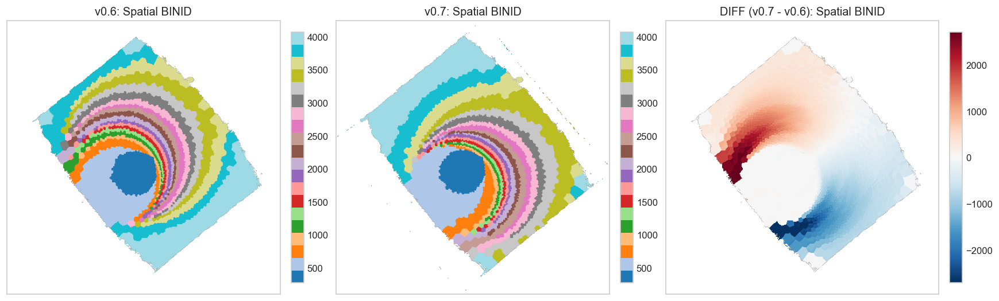

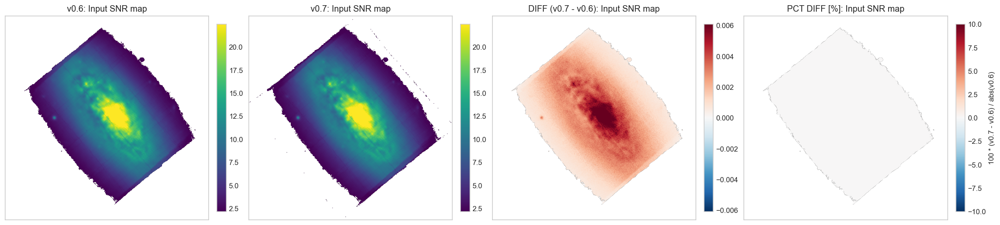

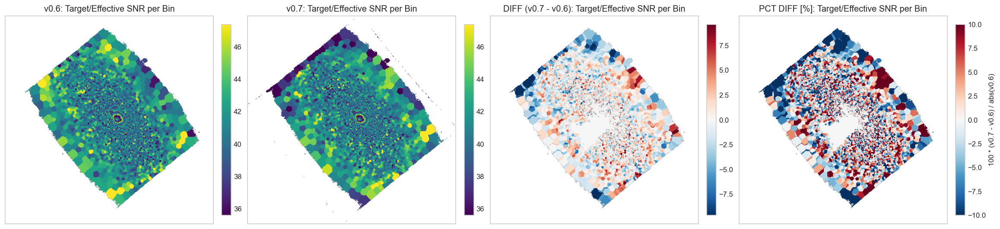

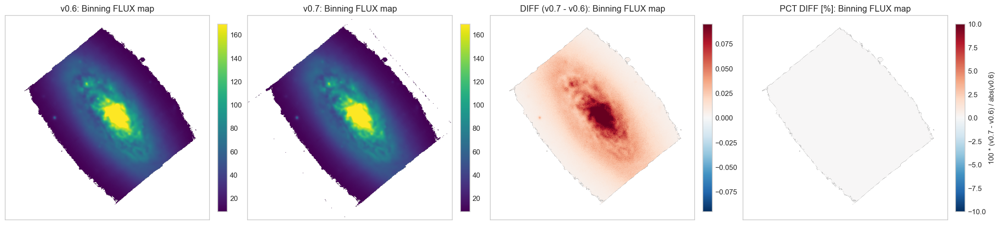

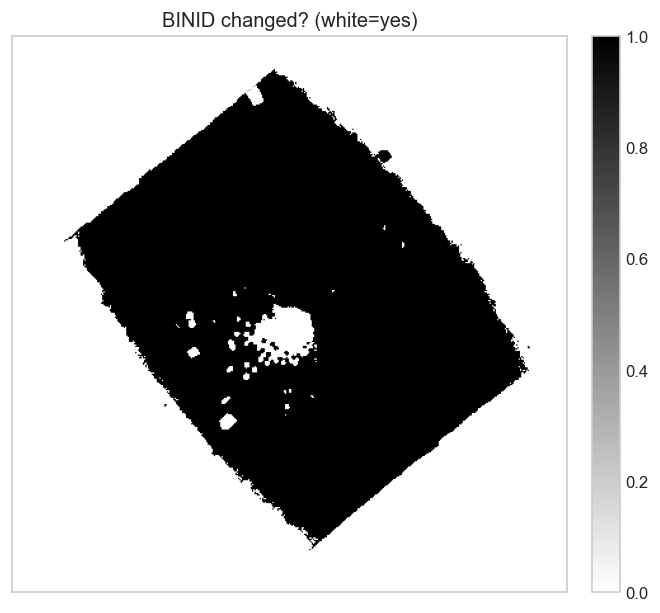

In [4]:
old_binid, new_binid = maps['spatial']['BINID']
valid_bin = np.isfinite(old_binid) & np.isfinite(new_binid)
same_bin = (old_binid == new_binid) & valid_bin

n_valid = int(valid_bin.sum())
frac_same = same_bin.sum() / n_valid if n_valid > 0 else np.nan

print(f'Valid spaxels with BINID in both runs: {n_valid}')
print(f'Fraction with identical BINID assignment: {frac_same:.4f}')
print(f'Unique bins v0.6: {np.unique(old_binid[valid_bin]).size}')
print(f'Unique bins v0.7: {np.unique(new_binid[valid_bin]).size}')

plot_triplet(old_binid, new_binid, 'Spatial BINID', cmap_main='tab20', cmap_diff='RdBu_r', show_percent=False)
plot_triplet(*maps['spatial']['SNR'], 'Input SNR map')
plot_triplet(*maps['spatial']['SNRBIN'], 'Target/Effective SNR per Bin')
plot_triplet(*maps['spatial']['FLUX'], 'Binning FLUX map')

changed = np.where(valid_bin, (old_binid != new_binid).astype(float), np.nan)
fig, ax = plt.subplots(1, 1, figsize=(6, 5), constrained_layout=True)
im = ax.imshow(changed, origin='lower', cmap='gray_r', vmin=0, vmax=1)
ax.set_title('BINID changed? (white=yes)')
ax.set_xticks([])
ax.set_yticks([])
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.show()
plt.close(fig)

## Stellar Kinematics Comparison


### V


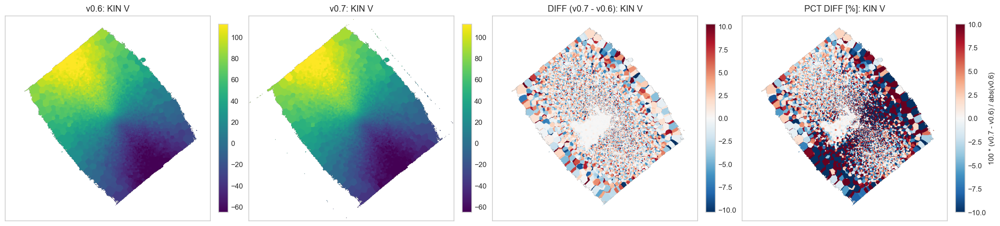

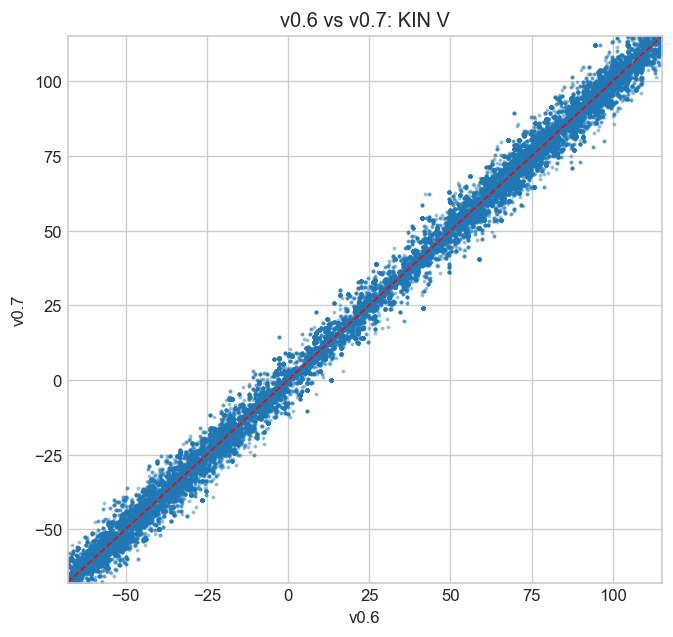


### SIGMA


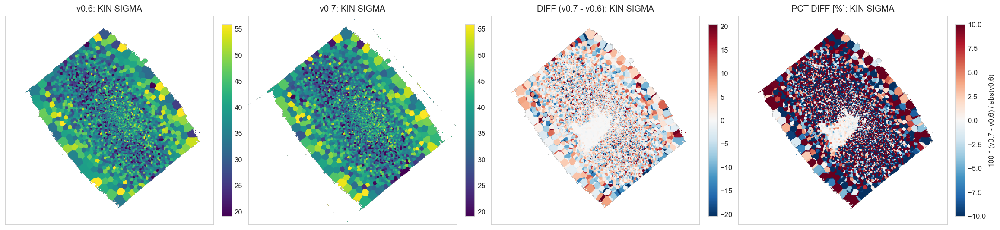

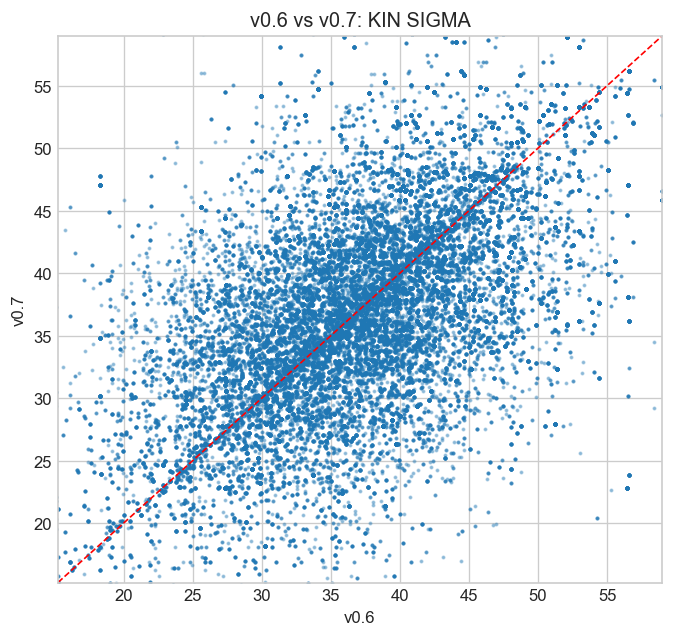


### H3


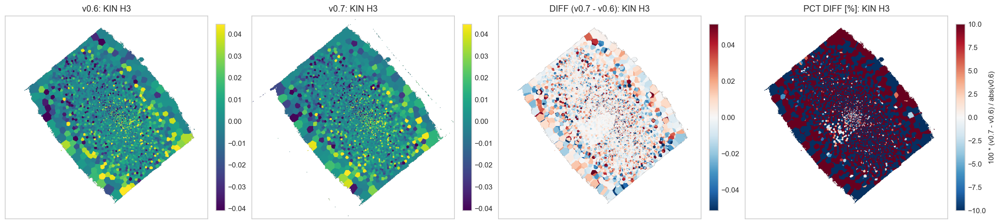

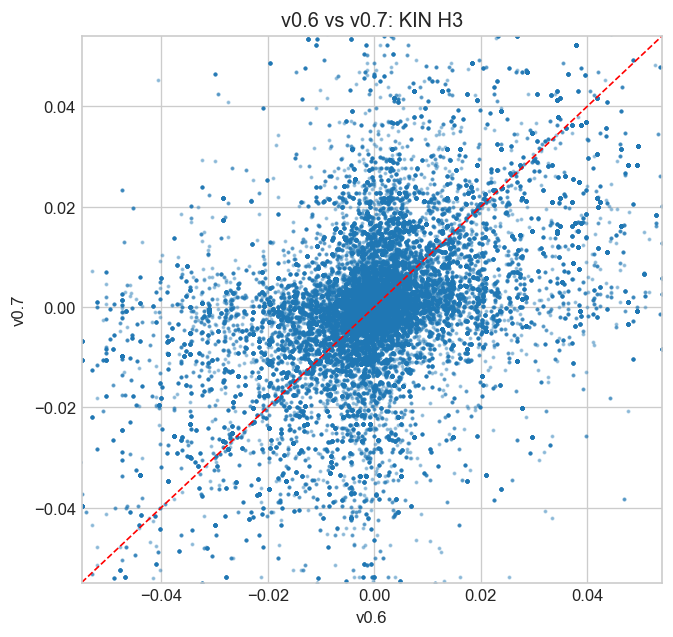


### H4


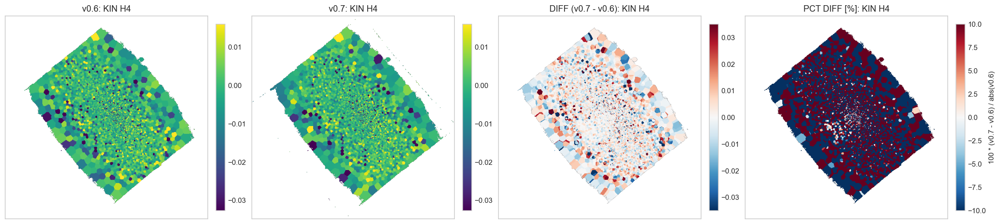

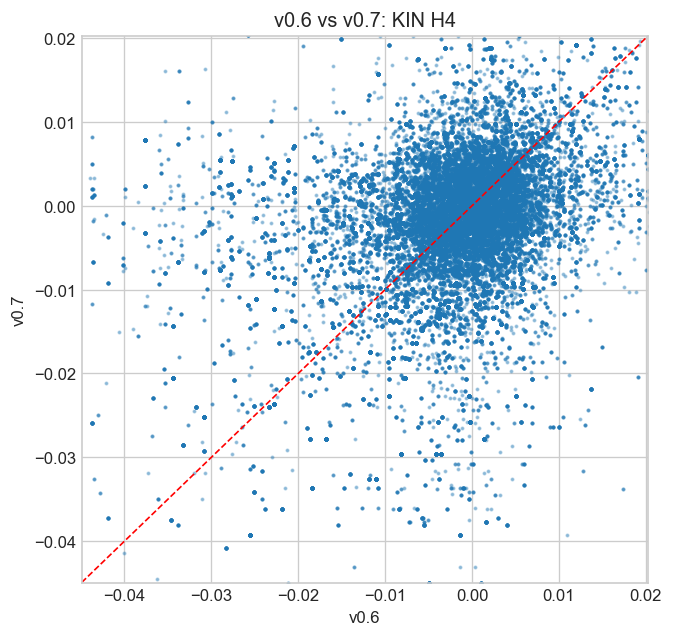

,quantity,n_valid,n_valid_nonzero_v0.6,median_v0.6,median_v0.7,median_delta_v0.7_minus_v0.6,mean_delta_v0.7_minus_v0.6,std_delta,rms_delta,median_pct_change,mean_pct_change,std_pct_change,rms_pct_change,median_abs_pct_change,pearson_r
0,KIN_V,73168,73168,26.885304,26.249923,-0.047821,-0.043247,3.985860,3.986094,-0.151006,-0.977448,268.918817,268.920593,4.929228,0.997065
1,KIN_SIGMA,73168,73168,37.759666,37.944591,0.088629,0.147073,7.779253,7.780643,0.234242,10.078709,179.816464,180.098698,11.713263,0.607640
2,KIN_H3,73168,73168,-0.000117,0.000257,0.000167,0.000074,0.017852,0.017852,2.777674,611.927492,76262.694941,76265.149937,99.005725,0.530216
3,KIN_H4,73168,73168,-0.000946,-0.001385,-0.000226,-0.000226,0.012366,0.012368,-5.867711,-187.613070,4573.979953,4577.826042,116.202931,0.429676


In [5]:
kin_stats = []
for quantity, (old_map, new_map) in maps['kin'].items():
    print(f'\n### {quantity}')
    plot_triplet(old_map, new_map, f'KIN {quantity}')
    scatter_old_new(old_map, new_map, f'KIN {quantity}')
    kin_stats.append(compare_stats(old_map, new_map, f'KIN_{quantity}'))

kin_stats_df = pd.DataFrame(kin_stats)
display(kin_stats_df)

## SFH Comparison


### AGE


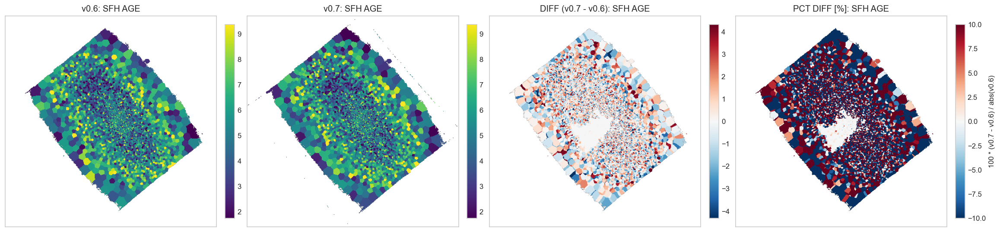

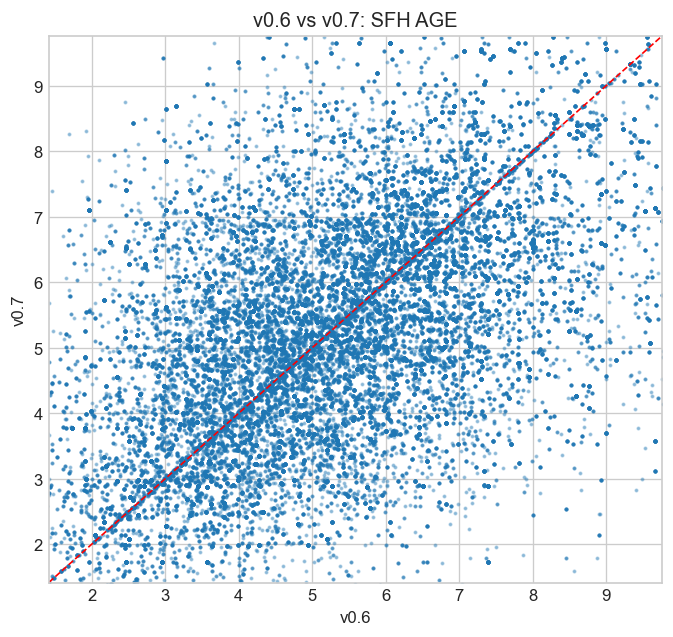


### METAL


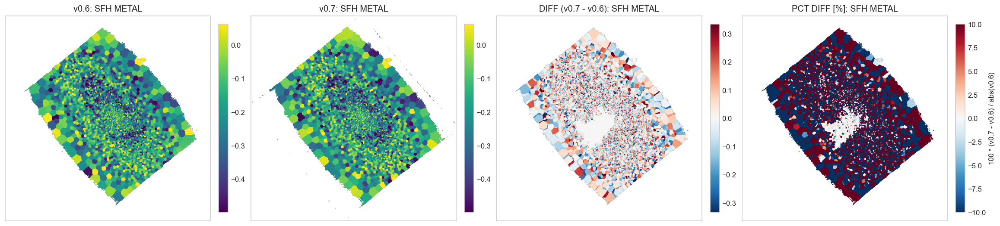

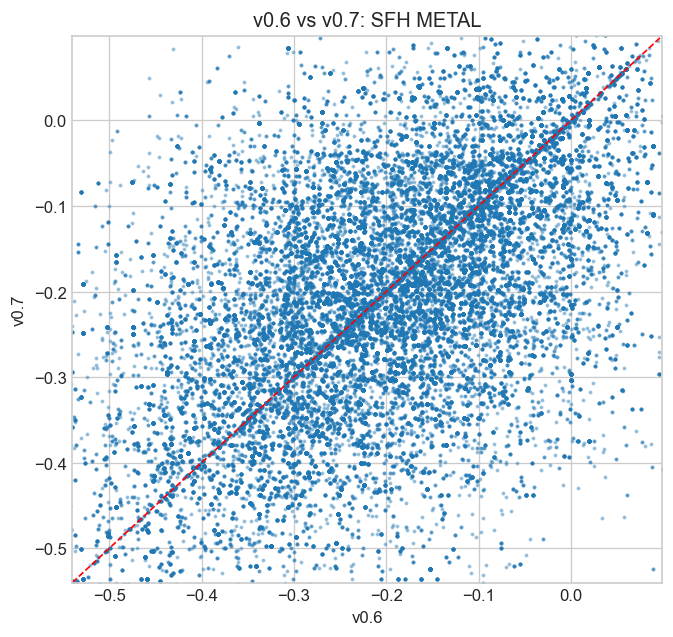


### ALPHA


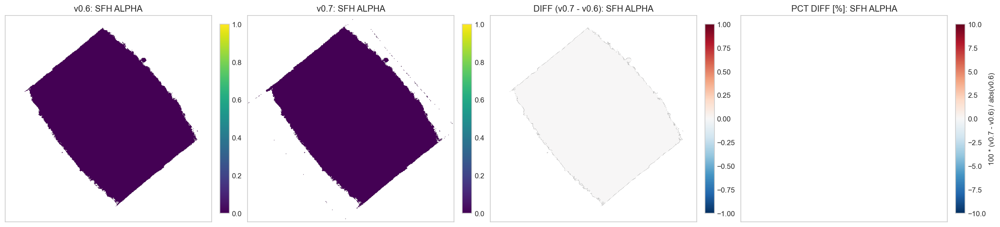

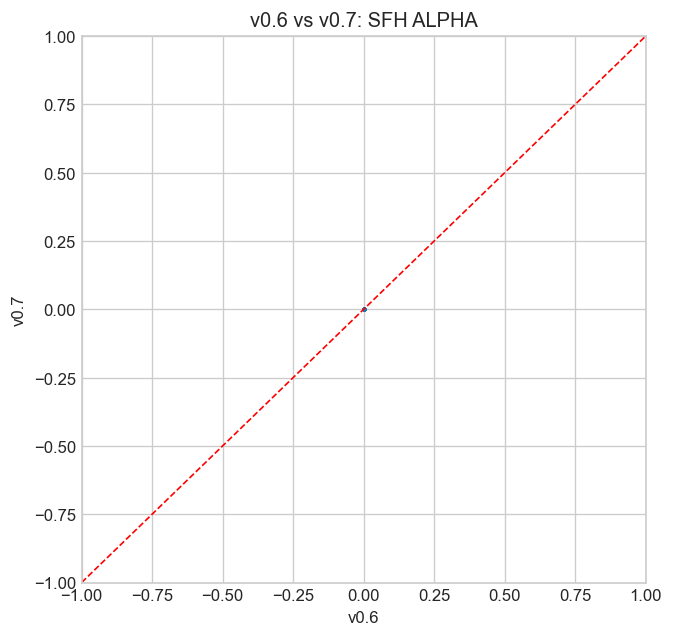


### EBV


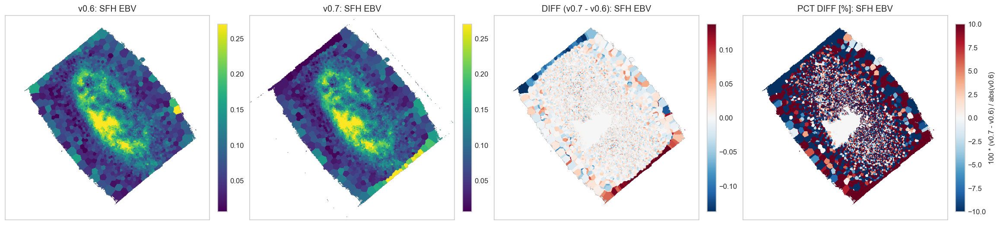

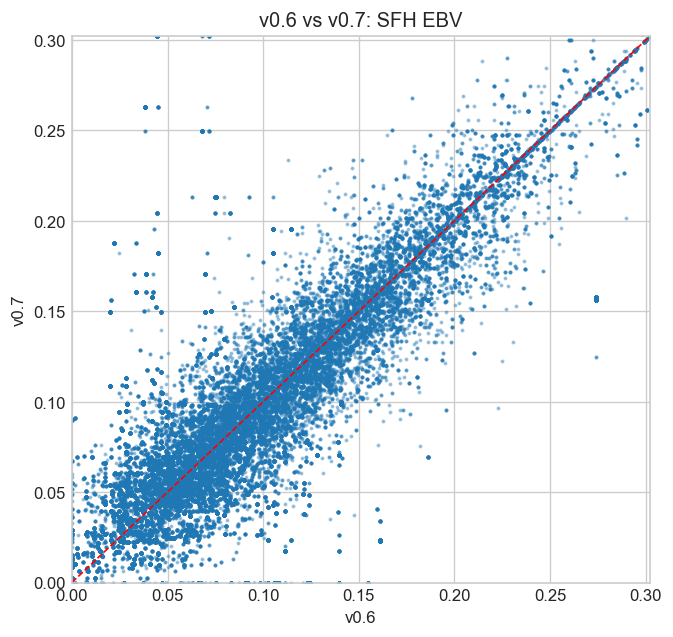

,quantity,n_valid,n_valid_nonzero_v0.6,median_v0.6,median_v0.7,median_delta_v0.7_minus_v0.6,mean_delta_v0.7_minus_v0.6,std_delta,rms_delta,median_pct_change,mean_pct_change,std_pct_change,rms_pct_change,median_abs_pct_change,pearson_r
0,SFH_AGE,73168,73168,5.196156,5.162351,-0.006563,-0.034908,1.693539,1.693899,-0.130427,5.488510,42.172195,42.527847,19.101167,0.578705
1,SFH_METAL,73168,73168,-0.188107,-0.189833,-0.000241,0.000532,0.130422,0.130423,-0.158128,-398.843464,5279.858293,5294.901294,42.458283,0.586716
2,SFH_ALPHA,73168,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
3,SFH_EBV,73168,72756,0.082652,0.080955,-0.000060,0.000161,0.039733,0.039733,-0.038376,15.515258,111.153215,112.230836,16.498736,0.794467


In [6]:
sfh_stats = []
for quantity, (old_map, new_map) in maps['sfh'].items():
    print(f'\n### {quantity}')
    plot_triplet(old_map, new_map, f'SFH {quantity}')
    scatter_old_new(old_map, new_map, f'SFH {quantity}')
    sfh_stats.append(compare_stats(old_map, new_map, f'SFH_{quantity}'))

sfh_stats_df = pd.DataFrame(sfh_stats)
display(sfh_stats_df)

## Emission-Line Gas Comparison

Flux maps are compared for the requested strong lines. Gas kinematics are compared for `HA6562` and `NII6548` using `VEL` and `SIGMA`. The v0.7 gas file also contains extra EW/continuum HDUs; those are not included here because the comparison is restricted to common, requested maps.


### HB4861_FLUX


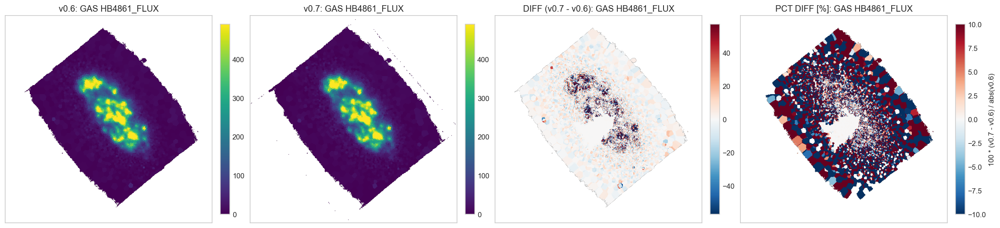

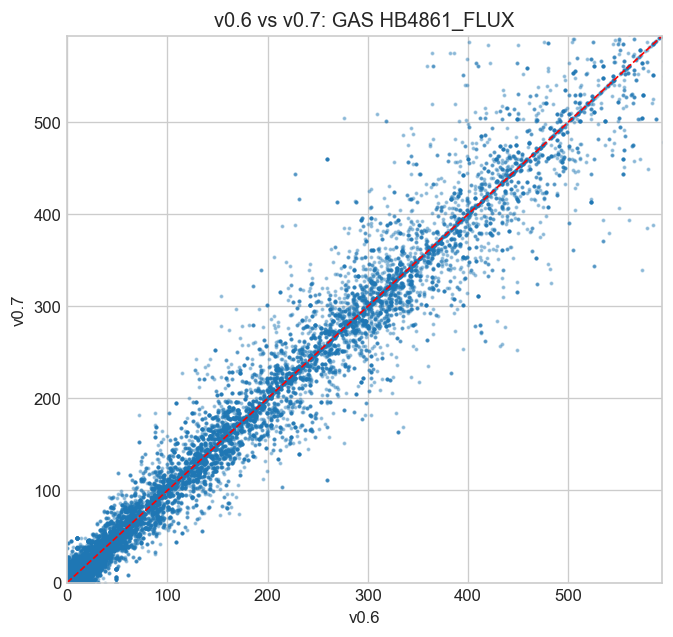


### OIII5006_FLUX


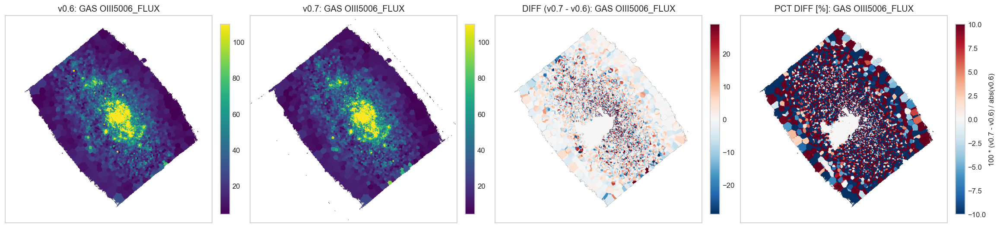

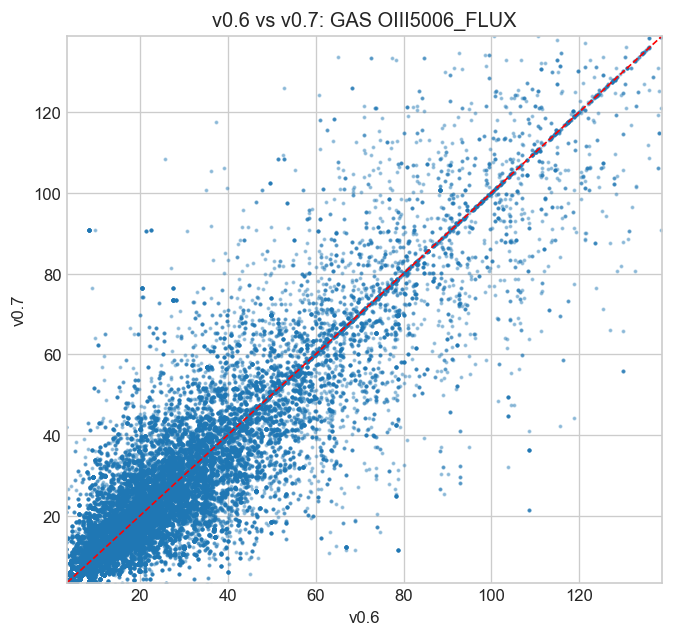


### NII6548_FLUX


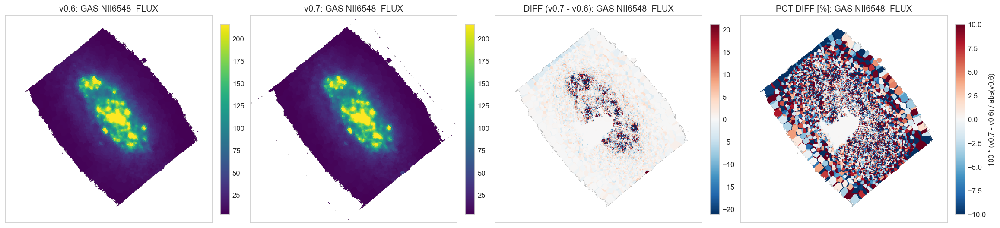

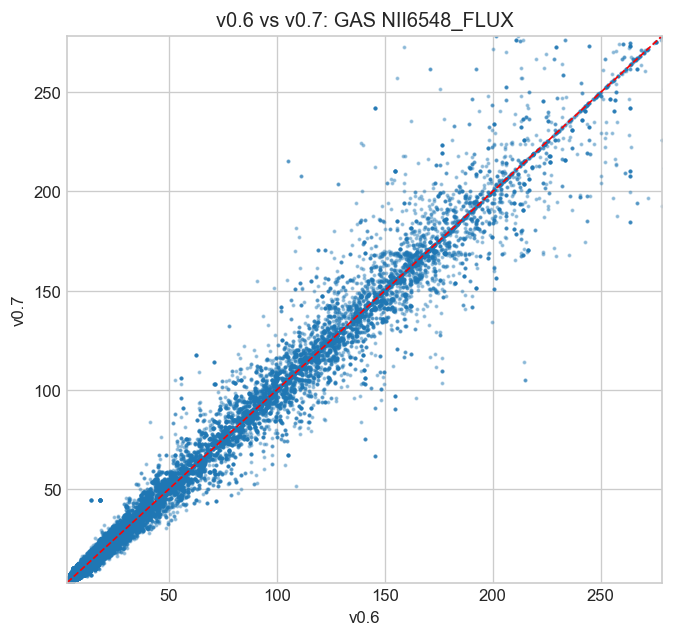


### HA6562_FLUX


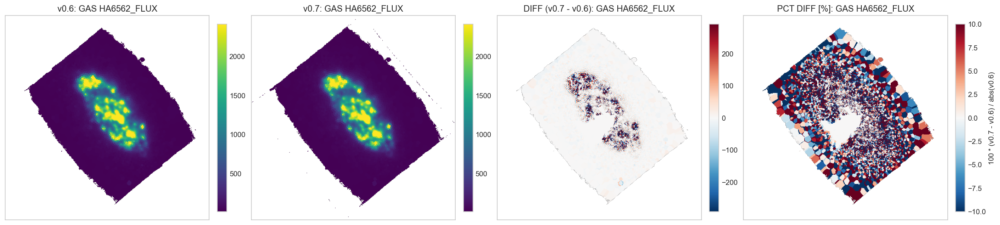

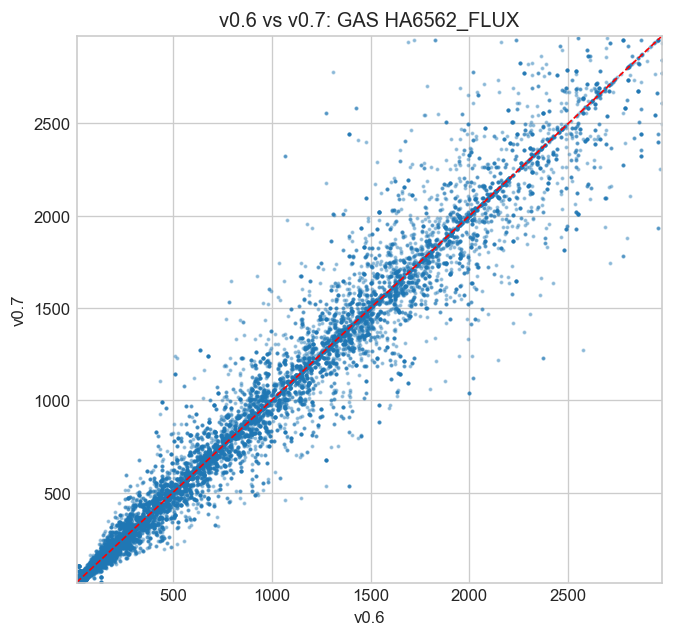


### SII6716_FLUX


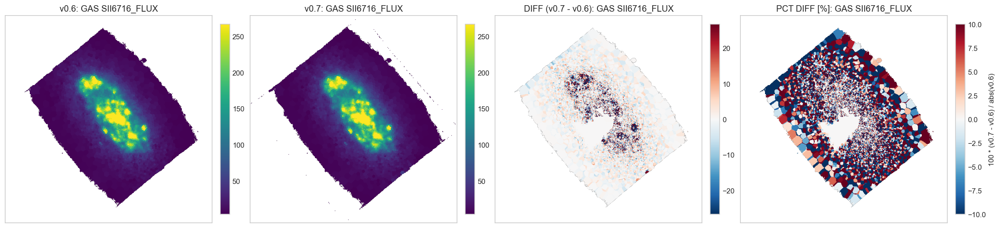

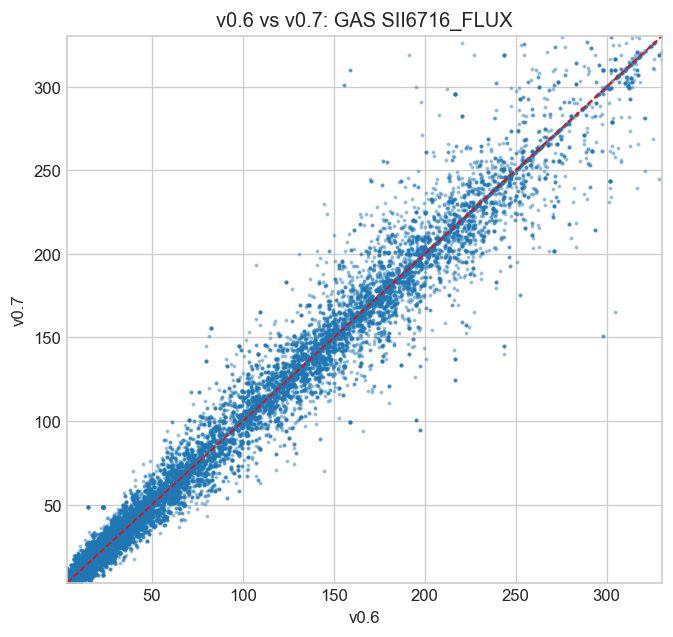


### SII6730_FLUX


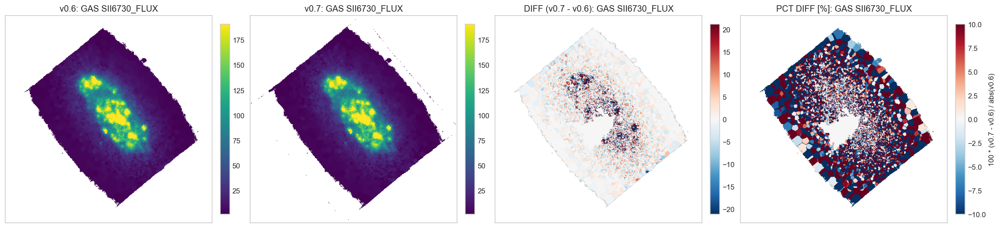

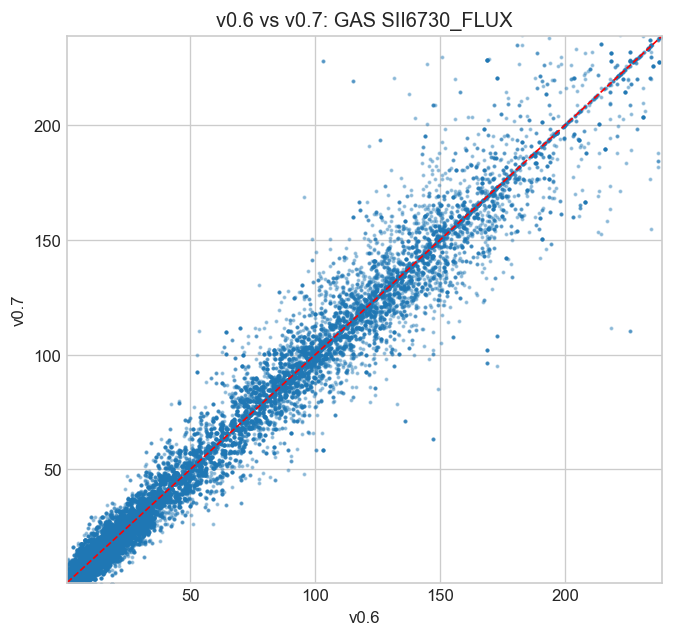


### HA6562_VEL


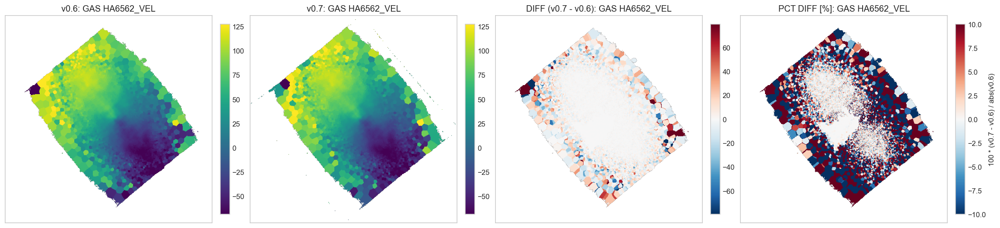

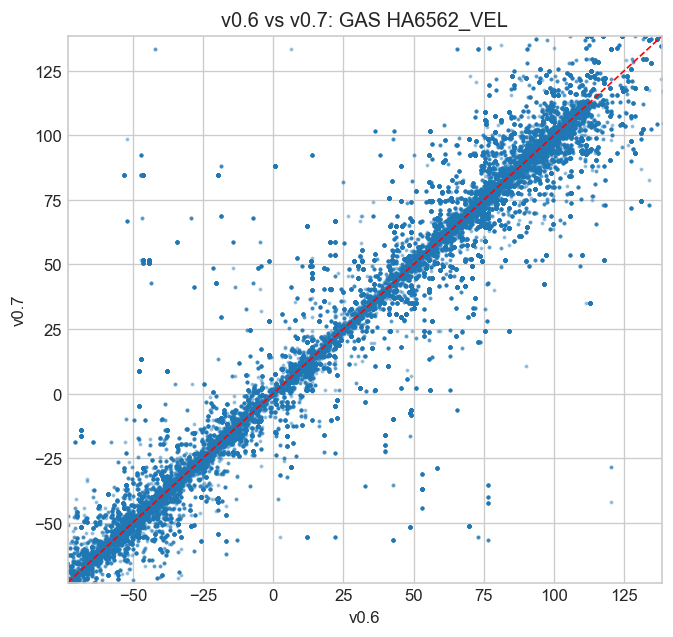


### HA6562_SIGMA


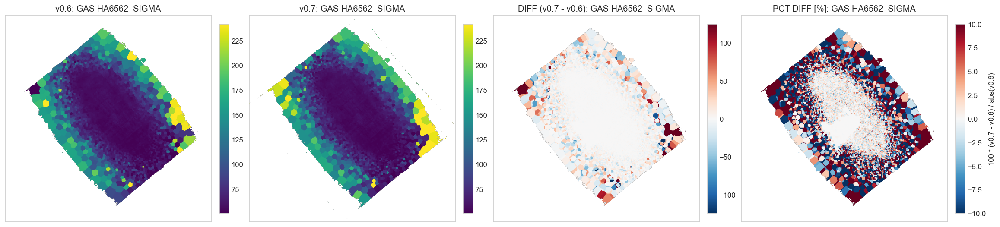

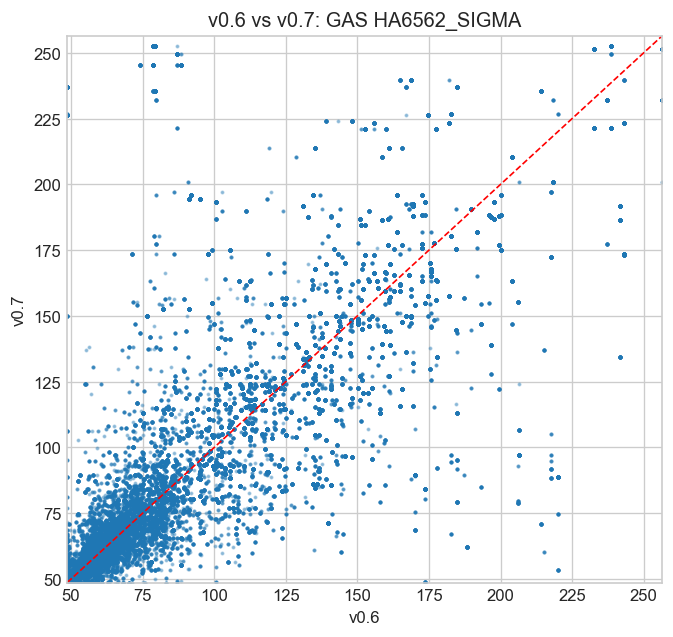


### NII6548_VEL


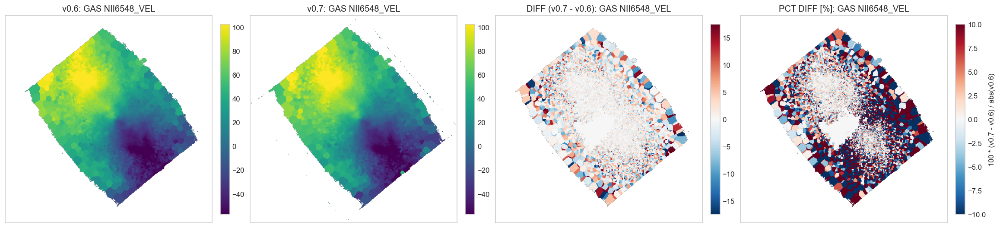

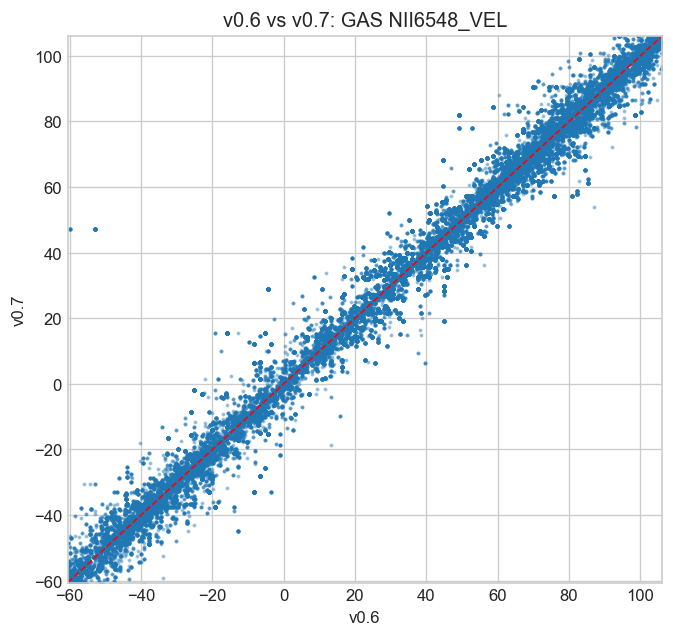


### NII6548_SIGMA


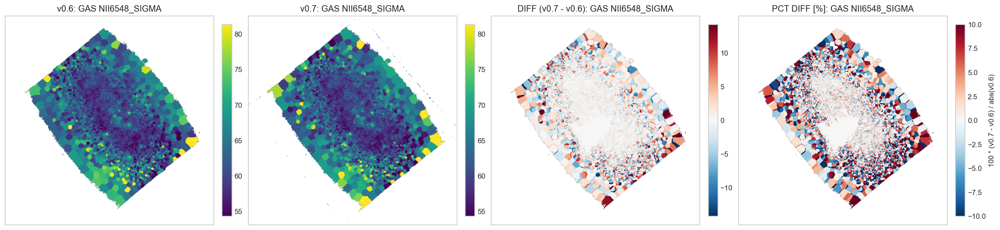

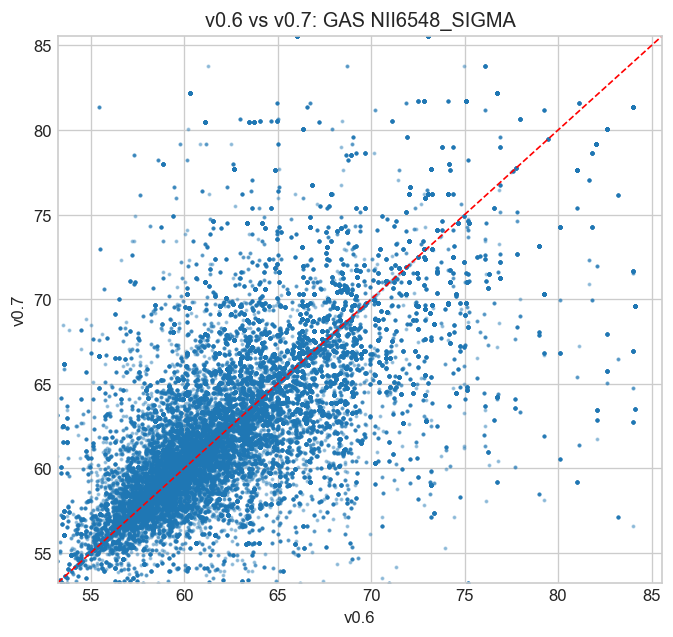

,quantity,n_valid,n_valid_nonzero_v0.6,median_v0.6,median_v0.7,median_delta_v0.7_minus_v0.6,mean_delta_v0.7_minus_v0.6,std_delta,rms_delta,median_pct_change,mean_pct_change,std_pct_change,rms_pct_change,median_abs_pct_change,pearson_r
0,GAS_HB4861_FLUX,73168,69580,10.875206,10.527033,0.075279,0.124455,17.518130,17.518572,0.076343,47.780289,589.101410,591.035894,23.558113,0.990827
1,GAS_OIII5006_FLUX,73168,72986,17.903311,17.664938,0.008967,-0.167271,9.715587,9.717027,0.025447,6.821186,54.435953,54.861658,17.795061,0.940279
2,GAS_NII6548_FLUX,73168,73168,13.871857,13.855151,0.009834,-0.021518,7.118332,7.118365,0.044766,0.291098,13.907023,13.910069,5.621154,0.992827
3,GAS_HA6562_FLUX,73168,73168,40.824854,41.114028,0.095373,0.185092,88.792531,88.792724,0.051028,2.823886,23.782953,23.950014,7.946672,0.990725
4,GAS_SII6716_FLUX,73168,73168,16.064678,15.885748,0.022230,-0.022177,9.259280,9.259307,0.051650,1.607980,21.993976,22.052678,8.584283,0.991936
5,GAS_SII6730_FLUX,73168,73111,9.893037,9.982737,0.010187,-0.032354,7.341298,7.341369,0.048551,3.961351,55.684309,55.825035,13.312114,0.990219
6,GAS_HA6562_VEL,73168,73168,53.780953,51.552422,-0.000493,1.787602,31.760740,31.811006,-0.002211,24.031517,559.938602,560.454059,8.415790,0.856322
7,GAS_HA6562_SIGMA,73168,73168,77.688368,77.267316,0.002387,3.470169,32.708974,32.892538,0.004168,6.423524,41.441157,41.936037,5.142667,0.823039
8,GAS_NII6548_VEL,73168,73168,39.624768,38.045535,-0.000012,0.053145,6.325222,6.325446,-0.000038,0.700160,104.498239,104.500584,5.549104,0.989962
9,GAS_NII6548_SIGMA,73168,73168,62.775817,62.937626,0.002361,0.408302,7.859939,7.870537,0.004057,0.801581,12.128724,12.155183,2.891123,0.509680


In [7]:
gas_stats = []
for quantity, (old_map, new_map) in maps['gas'].items():
    print(f'\n### {quantity}')
    plot_triplet(old_map, new_map, f'GAS {quantity}')
    scatter_old_new(old_map, new_map, f'GAS {quantity}')
    gas_stats.append(compare_stats(old_map, new_map, f'GAS_{quantity}'))

gas_stats_df = pd.DataFrame(gas_stats)
display(gas_stats_df)

## Combined Summary Table

In [8]:
summary_rows = []

for quantity in ('SNR', 'SNRBIN', 'FLUX'):
    summary_rows.append(compare_stats(*maps['spatial'][quantity], f'SPATIAL_{quantity}'))

for group_name in ('kin', 'sfh', 'gas'):
    for quantity, (old_map, new_map) in maps[group_name].items():
        summary_rows.append(compare_stats(old_map, new_map, f'{group_name.upper()}_{quantity}'))

summary = pd.DataFrame(summary_rows)
summary = summary[
    [
        'quantity',
        'n_valid',
        'n_valid_nonzero_v0.6',
        'median_v0.6',
        'median_v0.7',
        'median_delta_v0.7_minus_v0.6',
        'mean_delta_v0.7_minus_v0.6',
        'std_delta',
        'rms_delta',
        'median_pct_change',
        'mean_pct_change',
        'std_pct_change',
        'rms_pct_change',
        'median_abs_pct_change',
        'pearson_r',
    ]
]

display(summary)

# Uncomment if you want a lightweight table outside the notebook.
# summary.to_csv(f'{gal}_v0.6_v0.7_summary_stats.csv', index=False)

,quantity,n_valid,n_valid_nonzero_v0.6,median_v0.6,median_v0.7,median_delta_v0.7_minus_v0.6,mean_delta_v0.7_minus_v0.6,std_delta,rms_delta,median_pct_change,mean_pct_change,std_pct_change,rms_pct_change,median_abs_pct_change,pearson_r
0,SPATIAL_SNR,73168,73168,7.359070,7.361164,0.002023,0.002250,0.001409,0.002655,0.026972,0.027602,0.002361,0.027703,0.026972,1.000000
1,SPATIAL_SNRBIN,73168,73168,41.379464,41.180340,-0.188340,-0.453660,3.386857,3.417106,-0.453514,-0.805522,8.082795,8.122834,4.386143,0.133147
2,SPATIAL_FLUX,73168,73168,35.649820,35.670001,0.019745,0.025012,0.023839,0.034553,0.053980,0.055527,0.004942,0.055746,0.053980,1.000000
3,KIN_V,73168,73168,26.885304,26.249923,-0.047821,-0.043247,3.985860,3.986094,-0.151006,-0.977448,268.918817,268.920593,4.929228,0.997065
4,KIN_SIGMA,73168,73168,37.759666,37.944591,0.088629,0.147073,7.779253,7.780643,0.234242,10.078709,179.816464,180.098698,11.713263,0.607640
5,KIN_H3,73168,73168,-0.000117,0.000257,0.000167,0.000074,0.017852,0.017852,2.777674,611.927492,76262.694941,76265.149937,99.005725,0.530216
6,KIN_H4,73168,73168,-0.000946,-0.001385,-0.000226,-0.000226,0.012366,0.012368,-5.867711,-187.613070,4573.979953,4577.826042,116.202931,0.429676
7,SFH_AGE,73168,73168,5.196156,5.162351,-0.006563,-0.034908,1.693539,1.693899,-0.130427,5.488510,42.172195,42.527847,19.101167,0.578705
8,SFH_METAL,73168,73168,-0.188107,-0.189833,-0.000241,0.000532,0.130422,0.130423,-0.158128,-398.843464,5279.858293,5294.901294,42.458283,0.586716
9,SFH_ALPHA,73168,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN


## Automatic Conclusion Method

This final cell gives a compact automatic judgement for the science-map comparisons only. Diagnostic spatial-binning quantities are not included in the final conclusion table.

`SFH_EBV` is marked as expected different because extinction handling can vary between nGIST versions.

For all remaining science maps, the decision uses two metrics:

1. `pearson_r`: the Pearson correlation between finite v0.6 and v0.7 pixels. If `pearson_r < 0.9`, the map is classified as `changes a lot`.
2. `median_abs_pct_change`: the median absolute percentage change, computed from `100 * (v0.7 - v0.6) / abs(v0.6)` over pixels where the v0.6 value is non-zero.

The conclusion rule is:

- If `pearson_r < 0.9`, classify as `changes a lot`.
- If `pearson_r >= 0.9` and `median_abs_pct_change <= 10`, classify as `similar`.
- If `pearson_r >= 0.9` and `median_abs_pct_change > 10`, classify as `somewhat similar`.

For quantities that can be close to zero, such as `H3`, `H4`, or metallicity, percentage changes can look large even when absolute changes are small. The table therefore shows the exact metrics used for each decision.

In [9]:
PEARSON_SIMILAR_LIMIT = 0.9
PCT_SIMILAR_LIMIT = 10.0

EXPECTED_DIFFERENT_REASONS = {
    'SFH_EBV': 'Expected different: extinction treatment can vary between nGIST versions.',
}


def robust_auto_stats(old_map, new_map, quantity):
    old_map, new_map = align_map_pair(old_map, new_map, quantity)
    mask = np.isfinite(old_map) & np.isfinite(new_map)
    if mask.sum() == 0:
        return {
            'quantity': quantity,
            'n_valid': 0,
            'median_abs_pct_change': np.nan,
            'pearson_r': np.nan,
        }

    old = old_map[mask]
    new = new_map[mask]

    pct_mask = mask & (old_map != 0)
    if pct_mask.sum() > 0:
        pct = 100.0 * (new_map[pct_mask] - old_map[pct_mask]) / np.abs(old_map[pct_mask])
        median_abs_pct = float(np.nanmedian(np.abs(pct)))
    else:
        median_abs_pct = np.nan

    pearson_r = float(np.corrcoef(old, new)[0, 1]) if old.size > 1 and np.nanstd(old) > 0 and np.nanstd(new) > 0 else np.nan

    return {
        'quantity': quantity,
        'n_valid': int(mask.sum()),
        'median_abs_pct_change': median_abs_pct,
        'pearson_r': pearson_r,
    }


def auto_quantity_family(quantity):
    if quantity.startswith('KIN_'):
        name = quantity.replace('KIN_', '', 1)
        if name in ('V', 'SIGMA'):
            return 'stellar_kinematics'
        if name in ('H3', 'H4'):
            return 'stellar_higher_moment'
        return 'stellar_kinematics'
    if quantity.startswith('GAS_') and quantity.endswith('_FLUX'):
        return 'gas_flux'
    if quantity.startswith('GAS_') and (quantity.endswith('_VEL') or quantity.endswith('_SIGMA')):
        return 'gas_kinematics'
    if quantity.startswith('SFH_'):
        name = quantity.replace('SFH_', '', 1)
        if name == 'AGE':
            return 'sfh_age'
        if name == 'METAL':
            return 'sfh_metallicity'
        if name == 'ALPHA':
            return 'sfh_alpha'
        return 'sfh'
    return 'other'


def classify_auto_row(row):
    quantity = row['quantity']
    if quantity in EXPECTED_DIFFERENT_REASONS or quantity.endswith('_EBV'):
        return 'expected different', EXPECTED_DIFFERENT_REASONS.get(
            quantity,
            'Expected different: extinction treatment can vary between nGIST versions.',
        ), []
    if row['n_valid'] == 0:
        return 'no valid overlap', 'No pixels are finite in both runs.', ['n_valid']

    pearson_r = row['pearson_r']
    median_abs_pct = row['median_abs_pct_change']
    if not np.isfinite(pearson_r) or pearson_r < PEARSON_SIMILAR_LIMIT:
        return 'changes a lot', f'pearson_r < {PEARSON_SIMILAR_LIMIT}', ['pearson_r', 'median_abs_pct_change']
    if np.isfinite(median_abs_pct) and median_abs_pct <= PCT_SIMILAR_LIMIT:
        return 'similar', f'pearson_r >= {PEARSON_SIMILAR_LIMIT} and median_abs_pct_change <= {PCT_SIMILAR_LIMIT}', ['pearson_r', 'median_abs_pct_change']
    return 'somewhat similar', f'pearson_r >= {PEARSON_SIMILAR_LIMIT} but median_abs_pct_change > {PCT_SIMILAR_LIMIT}', ['pearson_r', 'median_abs_pct_change']


def format_metric_value(value):
    if not np.isfinite(value):
        return 'nan'
    if value == 0:
        return '0'
    if abs(value) >= 1000 or abs(value) < 0.001:
        return f'{value:.3e}'
    return f'{value:.3g}'


def format_decision_metrics(row):
    columns = row['decision_columns']
    if len(columns) == 0:
        return row['note']
    return '; '.join(f'{column}={format_metric_value(row[column])}' for column in columns)


auto_rows = []
for group_name, group_maps in maps.items():
    if group_name == 'spatial':
        continue
    for map_name, (old_map, new_map) in group_maps.items():
        quantity = f'{group_name.upper()}_{map_name}'
        row = robust_auto_stats(old_map, new_map, quantity)
        row['family'] = auto_quantity_family(quantity)
        auto_rows.append(row)

auto_conclusion_full = pd.DataFrame(auto_rows)
classified = auto_conclusion_full.apply(classify_auto_row, axis=1, result_type='expand')
auto_conclusion_full['auto_conclusion'] = classified[0]
auto_conclusion_full['note'] = classified[1]
auto_conclusion_full['decision_columns'] = classified[2]
auto_conclusion_full['decision_metrics'] = auto_conclusion_full.apply(format_decision_metrics, axis=1)

judged = auto_conclusion_full[auto_conclusion_full['auto_conclusion'].isin(['similar', 'somewhat similar', 'changes a lot'])]
not_judged = auto_conclusion_full[auto_conclusion_full['auto_conclusion'].isin(['expected different'])]

similar = judged.loc[judged['auto_conclusion'] == 'similar', 'quantity'].tolist()
somewhat = judged.loc[judged['auto_conclusion'] == 'somewhat similar', 'quantity'].tolist()
large = judged.loc[judged['auto_conclusion'] == 'changes a lot', 'quantity'].tolist()

print('Automatic conclusion')
print('Not judged:', not_judged['quantity'].tolist())
print('Similar:', similar if similar else 'None')
print('Somewhat similar:', somewhat if somewhat else 'None')
print('Changes a lot:', large if large else 'None')

auto_conclusion = auto_conclusion_full[
    ['quantity', 'family', 'auto_conclusion', 'decision_metrics']
]

display(auto_conclusion)

# Uncomment if you want a lightweight table outside the notebook.
# auto_conclusion.to_csv(f'{gal}_v0.6_v0.7_auto_conclusion.csv', index=False)

Automatic conclusion
Not judged: ['SFH_EBV']
Similar: ['KIN_V', 'GAS_NII6548_FLUX', 'GAS_HA6562_FLUX', 'GAS_SII6716_FLUX', 'GAS_NII6548_VEL']
Somewhat similar: ['GAS_HB4861_FLUX', 'GAS_OIII5006_FLUX', 'GAS_SII6730_FLUX']
Changes a lot: ['KIN_SIGMA', 'KIN_H3', 'KIN_H4', 'SFH_AGE', 'SFH_METAL', 'SFH_ALPHA', 'GAS_HA6562_VEL', 'GAS_HA6562_SIGMA', 'GAS_NII6548_SIGMA']


,quantity,family,auto_conclusion,decision_metrics
0,KIN_V,stellar_kinematics,similar,pearson_r=0.997; median_abs_pct_change=4.93
1,KIN_SIGMA,stellar_kinematics,changes a lot,pearson_r=0.608; median_abs_pct_change=11.7
2,KIN_H3,stellar_higher_moment,changes a lot,pearson_r=0.53; median_abs_pct_change=99
3,KIN_H4,stellar_higher_moment,changes a lot,pearson_r=0.43; median_abs_pct_change=116
4,SFH_AGE,sfh_age,changes a lot,pearson_r=0.579; median_abs_pct_change=19.1
5,SFH_METAL,sfh_metallicity,changes a lot,pearson_r=0.587; median_abs_pct_change=42.5
6,SFH_ALPHA,sfh_alpha,changes a lot,pearson_r=nan; median_abs_pct_change=nan
7,SFH_EBV,sfh,expected different,Expected different: extinction treatment can v...
8,GAS_HB4861_FLUX,gas_flux,somewhat similar,pearson_r=0.991; median_abs_pct_change=23.6
9,GAS_OIII5006_FLUX,gas_flux,somewhat similar,pearson_r=0.94; median_abs_pct_change=17.8
